<a href="https://colab.research.google.com/github/pritam-banik-roy/Multi_step_forcasting_Price_data/blob/main/WestBengail_Rice.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##Import necessary packages

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [ ]:
import seaborn as sns

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


##Import the 10 years price data excel file from drive


In [ ]:
df = pd.read_excel("/content/drive/MyDrive/WB_Rice/West_bengail_Rice_2013-2023.xlsx")

In [ ]:
df

,Sl no.,District Name,Market Name,Commodity,Variety,Grade,Min Price (Rs./Quintal),Max Price (Rs./Quintal),Modal Price (Rs./Quintal),Price Date
0,1,Jalpaiguri,Alipurduar,Rice,Fine,FAQ,2900,3000.0,2950,2014-12-31
1,2,Jalpaiguri,Alipurduar,Rice,Common,FAQ,2200,2300.0,2250,2014-12-31
2,3,Jalpaiguri,Alipurduar,Rice,Super Fine,FAQ,3500,3600.0,3550,2014-12-31
3,4,Jalpaiguri,Alipurduar,Rice,Super Fine,FAQ,3500,3600.0,3550,2014-12-30
4,5,Jalpaiguri,Alipurduar,Rice,Common,FAQ,2200,2300.0,2250,2014-12-30
...,...,...,...,...,...,...,...,...,...,...
241883,241884,Howrah,Uluberia,Rice,Sona Mansoori Non Basmati,FAQ,2650,2850.0,2750,2023-01-03
241884,241885,Howrah,Uluberia,Rice,Sona Mansoori Non Basmati,FAQ,2650,2850.0,2750,2023-01-02
241885,241886,Howrah,Uluberia,Rice,Other,FAQ,3000,3200.0,3100,2023-01-02
241886,241887,Howrah,Uluberia,Rice,Other,FAQ,3000,3200.0,3100,2023-01-01


In [ ]:
df.dtypes

Sl no.                                int64
District Name                        object
Market Name                          object
Commodity                            object
Variety                              object
Grade                                object
Min Price (Rs./Quintal)               int64
Max Price (Rs./Quintal)             float64
Modal Price (Rs./Quintal)             int64
Price Date                   datetime64[ns]
dtype: object

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 241888 entries, 0 to 241887
Data columns (total 10 columns):
 #   Column                     Non-Null Count   Dtype         
---  ------                     --------------   -----         
 0   Sl no.                     241888 non-null  int64         
 1   District Name              241888 non-null  object        
 2   Market Name                241888 non-null  object        
 3   Commodity                  241888 non-null  object        
 4   Variety                    241888 non-null  object        
 5   Grade                      241888 non-null  object        
 6   Min Price (Rs./Quintal)    241888 non-null  int64         
 7   Max Price (Rs./Quintal)    241888 non-null  float64       
 8   Modal Price (Rs./Quintal)  241888 non-null  int64         
 9   Price Date                 241888 non-null  datetime64[ns]
dtypes: datetime64[ns](1), float64(1), int64(3), object(5)
memory usage: 18.5+ MB


In [ ]:
columns_dtype = {'Sl no.':int,
                  'Min Price (Rs./Quintal)':int,
                  'Max Price (Rs./Quintal)':int,
                  'Modal Price (Rs./Quintal)':int,
                 }
df = df.astype(columns_dtype)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 241888 entries, 0 to 241887
Data columns (total 10 columns):
 #   Column                     Non-Null Count   Dtype         
---  ------                     --------------   -----         
 0   Sl no.                     241888 non-null  int64         
 1   District Name              241888 non-null  object        
 2   Market Name                241888 non-null  object        
 3   Commodity                  241888 non-null  object        
 4   Variety                    241888 non-null  object        
 5   Grade                      241888 non-null  object        
 6   Min Price (Rs./Quintal)    241888 non-null  int64         
 7   Max Price (Rs./Quintal)    241888 non-null  int64         
 8   Modal Price (Rs./Quintal)  241888 non-null  int64         
 9   Price Date                 241888 non-null  datetime64[ns]
dtypes: datetime64[ns](1), int64(4), object(5)
memory usage: 18.5+ MB


In [ ]:
df.shape

(241888, 10)

In [ ]:
#all District names
dist_name = df['District Name'].unique()

In [ ]:
dist_name

array(['Jalpaiguri', 'Burdwan', 'Dakshin Dinajpur', 'Bankura',
       'North 24 Parganas', 'Sounth 24 Parganas', 'Coochbehar',
       'Murshidabad', 'Nadia', 'Birbhum', 'Hooghly', 'Darjeeling',
       'Medinipur(E)', 'Malda', 'Medinipur(W)', 'Uttar Dinajpur',
       'Puruliya', 'Howrah', 'Kolkata'], dtype=object)

In [ ]:
dist_name =  list(dist_name)

In [ ]:
dist_name

['Jalpaiguri',
 'Burdwan',
 'Dakshin Dinajpur',
 'Bankura',
 'North 24 Parganas',
 'Sounth 24 Parganas',
 'Coochbehar',
 'Murshidabad',
 'Nadia',
 'Birbhum',
 'Hooghly',
 'Darjeeling',
 'Medinipur(E)',
 'Malda',
 'Medinipur(W)',
 'Uttar Dinajpur',
 'Puruliya',
 'Howrah',
 'Kolkata']

In [ ]:
len(dist_name)

19

In [ ]:
#all District names
market_name = df['Market Name'].unique()

In [ ]:
market_name

array(['Alipurduar', 'Asansol', 'Balurghat', 'Bankura Sadar', 'Barasat',
       'Baruipur(Canning)', 'Baxirhat', 'Belacoba', 'Beldanga',
       'Bethuadahari', 'Birbhum', 'Bishnupur', 'Bishnupur(Bankura)',
       'Bolpur', 'Burdwan', 'Chakdah', 'Champadanga', 'ChinSurah',
       'Coochbehar', 'Darjeeling', 'Darjeeling(Klimpong)',
       'Diamond Harbour', 'Diamond Harbour(South 24-pgs)', 'Dinhata',
       'Durgapur', 'Egra/contai', 'English Bazar', 'Falakata(Dhupguri)',
       'Gajol', 'Gangarampur', 'Garbeta(Medinipur)', 'Ghatal', 'Guskara',
       'Guskara(Burdwan)', 'Habra', 'Haldibari', 'Indus',
       'Indus(Bankura Sadar)', 'Islampur', 'Jalpaiguri Sadar', 'Jangipur',
       'Jhargram', 'Jiaganj', 'Jiaganj(Lalbagh)', 'Kaliaganj',
       'Kalimpong', 'Kalipur', 'Kalipur(Champadanga)', 'Kalna', 'Kalyani',
       'Kandi', 'Karimpur', 'Karsiyang(Matigara)', 'Kasimbazar',
       'Kasipur', 'Katwa', 'Khatra', 'Lalbagh', 'Mathabhanga',
       'Medinipur(West)', 'Mekhliganj', 'Memari', 'M

In [ ]:
len(market_name)

85

In [ ]:

district_market_variety = {}

for district in dist_name:
  district_market_variety[district] = {}
  for market in df[df['District Name'] == district]['Market Name'].unique():
    district_market_variety[district][market] = df[(df['District Name'] == district) & (df['Market Name'] == market)]['Variety'].unique().tolist()

print(district_market_variety)


{'Jalpaiguri': {'Alipurduar': ['Fine', 'Common', 'Super Fine', 'Fine(Basmati)', 'Other'], 'Belacoba': ['Super Fine', 'Fine', 'Other'], 'Falakata(Dhupguri)': ['Other', 'Fine', 'Super Fine'], 'Jalpaiguri Sadar': ['Fine', 'Other', 'Super Fine'], 'Falakata': ['Common', 'Fine', 'Other']}, 'Burdwan': {'Asansol': ['Fine', 'Other'], 'Burdwan': ['Common', 'Fine', 'Coarse'], 'Durgapur': ['Fine', 'Other'], 'Guskara': ['Fine', 'Other'], 'Guskara(Burdwan)': ['Fine', 'Common'], 'Kalna': ['Coarse (I.R.20)', 'Fine', 'Coarse', 'Other'], 'Katwa': ['Other', 'Fine', 'Common'], 'Memari': ['Common', 'Fine', 'Coarse']}, 'Dakshin Dinajpur': {'Balurghat': ['Other', 'Masuri', 'Coarse', 'Common'], 'Gangarampur': ['Fine', 'Other'], 'Gangarampur(Dakshin Dinajpur)': ['Common']}, 'Bankura': {'Bankura Sadar': ['Other', 'Common'], 'Bishnupur(Bankura)': ['Other', 'Masuri', 'Sona Mansoori Non Basmati', 'Common', 'Fine'], 'Indus': ['Other', 'Fine'], 'Indus(Bankura Sadar)': ['Other', 'Common', 'Fine'], 'Khatra': ['Other',

In [ ]:
district_market_variety

{'Jalpaiguri': {'Alipurduar': ['Fine',
   'Common',
   'Super Fine',
   'Fine(Basmati)',
   'Other'],
  'Belacoba': ['Super Fine', 'Fine', 'Other'],
  'Falakata(Dhupguri)': ['Other', 'Fine', 'Super Fine'],
  'Jalpaiguri Sadar': ['Fine', 'Other', 'Super Fine'],
  'Falakata': ['Common', 'Fine', 'Other']},
 'Burdwan': {'Asansol': ['Fine', 'Other'],
  'Burdwan': ['Common', 'Fine', 'Coarse'],
  'Durgapur': ['Fine', 'Other'],
  'Guskara': ['Fine', 'Other'],
  'Guskara(Burdwan)': ['Fine', 'Common'],
  'Kalna': ['Coarse (I.R.20)', 'Fine', 'Coarse', 'Other'],
  'Katwa': ['Other', 'Fine', 'Common'],
  'Memari': ['Common', 'Fine', 'Coarse']},
 'Dakshin Dinajpur': {'Balurghat': ['Other', 'Masuri', 'Coarse', 'Common'],
  'Gangarampur': ['Fine', 'Other'],
  'Gangarampur(Dakshin Dinajpur)': ['Common']},
 'Bankura': {'Bankura Sadar': ['Other', 'Common'],
  'Bishnupur(Bankura)': ['Other',
   'Masuri',
   'Sona Mansoori Non Basmati',
   'Common',
   'Fine'],
  'Indus': ['Other', 'Fine'],
  'Indus(Bankur

In [ ]:
# prompt: from district_market change the market name  Egra/contai to Egra

district_market_variety = {}

for district in dist_name:
  district_market_variety[district] = {}
  for market in df[df['District Name'] == district]['Market Name'].unique():
    if market == 'Egra/contai':
      market = 'Egra'
    district_market_variety[district][market] = df[(df['Medinipur(E)'] == district) & (df['Market Name'] == market)]['Variety'].unique().tolist()

print(district_market_variety)


{'Jalpaiguri': {'Alipurduar': ['Fine', 'Common', 'Super Fine', 'Fine(Basmati)', 'Other'], 'Belacoba': ['Super Fine', 'Fine', 'Other'], 'Falakata(Dhupguri)': ['Other', 'Fine', 'Super Fine'], 'Jalpaiguri Sadar': ['Fine', 'Other', 'Super Fine'], 'Falakata': ['Common', 'Fine', 'Other']}, 'Burdwan': {'Asansol': ['Fine', 'Other'], 'Burdwan': ['Common', 'Fine', 'Coarse'], 'Durgapur': ['Fine', 'Other'], 'Guskara': ['Fine', 'Other'], 'Guskara(Burdwan)': ['Fine', 'Common'], 'Kalna': ['Coarse (I.R.20)', 'Fine', 'Coarse', 'Other'], 'Katwa': ['Other', 'Fine', 'Common'], 'Memari': ['Common', 'Fine', 'Coarse']}, 'Dakshin Dinajpur': {'Balurghat': ['Other', 'Masuri', 'Coarse', 'Common'], 'Gangarampur': ['Fine', 'Other'], 'Gangarampur(Dakshin Dinajpur)': ['Common']}, 'Bankura': {'Bankura Sadar': ['Other', 'Common'], 'Bishnupur(Bankura)': ['Other', 'Masuri', 'Sona Mansoori Non Basmati', 'Common', 'Fine'], 'Indus': ['Other', 'Fine'], 'Indus(Bankura Sadar)': ['Other', 'Common', 'Fine'], 'Khatra': ['Other',

In [ ]:
# prompt: in previous code the Egra/contai name is changes to Egra but it did not contains the variety names so write the code in such way that Egra contains the variety names also

district_market_variety = {}

for district in dist_name:
  district_market_variety[district] = {}
  for market in df[df['District Name'] == district]['Market Name'].unique():
    if market == 'Egra/contai':
      market = 'Egra'
    district_market_variety[district][market] = df[(df['District Name'] == district) & (df['Market Name'] == market)]['Variety'].unique().tolist()

# Add the varieties for Egra manually
district_market_variety['Medinipur(E)']['Egra'].extend(df[(df['District Name'] == 'Medinipur(E)') & (df['Market Name'] == 'Egra/contai')]['Variety'].unique().tolist())

print(district_market_variety)


{'Jalpaiguri': {'Alipurduar': ['Fine', 'Common', 'Super Fine', 'Fine(Basmati)', 'Other'], 'Belacoba': ['Super Fine', 'Fine', 'Other'], 'Falakata(Dhupguri)': ['Other', 'Fine', 'Super Fine'], 'Jalpaiguri Sadar': ['Fine', 'Other', 'Super Fine'], 'Falakata': ['Common', 'Fine', 'Other']}, 'Burdwan': {'Asansol': ['Fine', 'Other'], 'Burdwan': ['Common', 'Fine', 'Coarse'], 'Durgapur': ['Fine', 'Other'], 'Guskara': ['Fine', 'Other'], 'Guskara(Burdwan)': ['Fine', 'Common'], 'Kalna': ['Coarse (I.R.20)', 'Fine', 'Coarse', 'Other'], 'Katwa': ['Other', 'Fine', 'Common'], 'Memari': ['Common', 'Fine', 'Coarse']}, 'Dakshin Dinajpur': {'Balurghat': ['Other', 'Masuri', 'Coarse', 'Common'], 'Gangarampur': ['Fine', 'Other'], 'Gangarampur(Dakshin Dinajpur)': ['Common']}, 'Bankura': {'Bankura Sadar': ['Other', 'Common'], 'Bishnupur(Bankura)': ['Other', 'Masuri', 'Sona Mansoori Non Basmati', 'Common', 'Fine'], 'Indus': ['Other', 'Fine'], 'Indus(Bankura Sadar)': ['Other', 'Common', 'Fine'], 'Khatra': ['Other',

In [ ]:
# prompt: in district_market_variety delete Egra market

district_market_variety['Medinipur(E)'].pop('Egra')


['Fine', 'Coarse']

In [ ]:
district_market_variety

{'Jalpaiguri': {'Alipurduar': ['Fine',
   'Common',
   'Super Fine',
   'Fine(Basmati)',
   'Other'],
  'Belacoba': ['Super Fine', 'Fine', 'Other'],
  'Falakata(Dhupguri)': ['Other', 'Fine', 'Super Fine'],
  'Jalpaiguri Sadar': ['Fine', 'Other', 'Super Fine'],
  'Falakata': ['Common', 'Fine', 'Other']},
 'Burdwan': {'Asansol': ['Fine', 'Other'],
  'Burdwan': ['Common', 'Fine', 'Coarse'],
  'Durgapur': ['Fine', 'Other'],
  'Guskara': ['Fine', 'Other'],
  'Guskara(Burdwan)': ['Fine', 'Common'],
  'Kalna': ['Coarse (I.R.20)', 'Fine', 'Coarse', 'Other'],
  'Katwa': ['Other', 'Fine', 'Common'],
  'Memari': ['Common', 'Fine', 'Coarse']},
 'Dakshin Dinajpur': {'Balurghat': ['Other', 'Masuri', 'Coarse', 'Common'],
  'Gangarampur': ['Fine', 'Other'],
  'Gangarampur(Dakshin Dinajpur)': ['Common']},
 'Bankura': {'Bankura Sadar': ['Other', 'Common'],
  'Bishnupur(Bankura)': ['Other',
   'Masuri',
   'Sona Mansoori Non Basmati',
   'Common',
   'Fine'],
  'Indus': ['Other', 'Fine'],
  'Indus(Bankur

In [ ]:
district_market_variety

{'Jalpaiguri': {'Alipurduar': ['Fine',
   'Common',
   'Super Fine',
   'Fine(Basmati)',
   'Other'],
  'Belacoba': ['Super Fine', 'Fine', 'Other'],
  'Falakata(Dhupguri)': ['Other', 'Fine', 'Super Fine'],
  'Jalpaiguri Sadar': ['Fine', 'Other', 'Super Fine'],
  'Falakata': ['Common', 'Fine', 'Other']},
 'Burdwan': {'Asansol': ['Fine', 'Other'],
  'Burdwan': ['Common', 'Fine', 'Coarse'],
  'Durgapur': ['Fine', 'Other'],
  'Guskara': ['Fine', 'Other'],
  'Guskara(Burdwan)': ['Fine', 'Common'],
  'Kalna': ['Coarse (I.R.20)', 'Fine', 'Coarse', 'Other'],
  'Katwa': ['Other', 'Fine', 'Common'],
  'Memari': ['Common', 'Fine', 'Coarse']},
 'Dakshin Dinajpur': {'Balurghat': ['Other', 'Masuri', 'Coarse', 'Common'],
  'Gangarampur': ['Fine', 'Other'],
  'Gangarampur(Dakshin Dinajpur)': ['Common']},
 'Bankura': {'Bankura Sadar': ['Other', 'Common'],
  'Bishnupur(Bankura)': ['Other',
   'Masuri',
   'Sona Mansoori Non Basmati',
   'Common',
   'Fine'],
  'Indus': ['Other', 'Fine'],
  'Indus(Bankur

In [ ]:
district_market_variety

{'Jalpaiguri': {'Alipurduar': ['Fine',
   'Common',
   'Super Fine',
   'Fine(Basmati)',
   'Other'],
  'Belacoba': ['Super Fine', 'Fine', 'Other'],
  'Falakata(Dhupguri)': ['Other', 'Fine', 'Super Fine'],
  'Jalpaiguri Sadar': ['Fine', 'Other', 'Super Fine'],
  'Falakata': ['Common', 'Fine', 'Other']},
 'Burdwan': {'Asansol': ['Fine', 'Other'],
  'Burdwan': ['Common', 'Fine', 'Coarse'],
  'Durgapur': ['Fine', 'Other'],
  'Guskara': ['Fine', 'Other'],
  'Guskara(Burdwan)': ['Fine', 'Common'],
  'Kalna': ['Coarse (I.R.20)', 'Fine', 'Coarse', 'Other'],
  'Katwa': ['Other', 'Fine', 'Common'],
  'Memari': ['Common', 'Fine', 'Coarse']},
 'Dakshin Dinajpur': {'Balurghat': ['Other', 'Masuri', 'Coarse', 'Common'],
  'Gangarampur': ['Fine', 'Other'],
  'Gangarampur(Dakshin Dinajpur)': ['Common']},
 'Bankura': {'Bankura Sadar': ['Other', 'Common'],
  'Bishnupur(Bankura)': ['Other',
   'Masuri',
   'Sona Mansoori Non Basmati',
   'Common',
   'Fine'],
  'Indus': ['Other', 'Fine'],
  'Indus(Bankur

In [ ]:
# prompt: write a code to print varieties of a particular market and district from district_market_variety . put the varieties in a list and return that list not using funtion

district = "Jalpaiguri"
market = "Alipurduar"

varieties = district_market_variety[district][market]

print(f"Varieties of rice in {market} market of {district} district:")
print(varieties)


Varieties of rice in Alipurduar market of Jalpaiguri district:
['Fine', 'Common', 'Super Fine', 'Fine(Basmati)', 'Other']


In [ ]:
def get_markets_and_varieties(district):
    if district in district_market_variety:
        markets = list(district_market_variety[district].keys())
        return markets, []
    else:
        return [], []

In [ ]:
markets, varieties = get_markets_and_varieties('Jalpaiguri')

In [ ]:
varieties

[]

##Data visualization

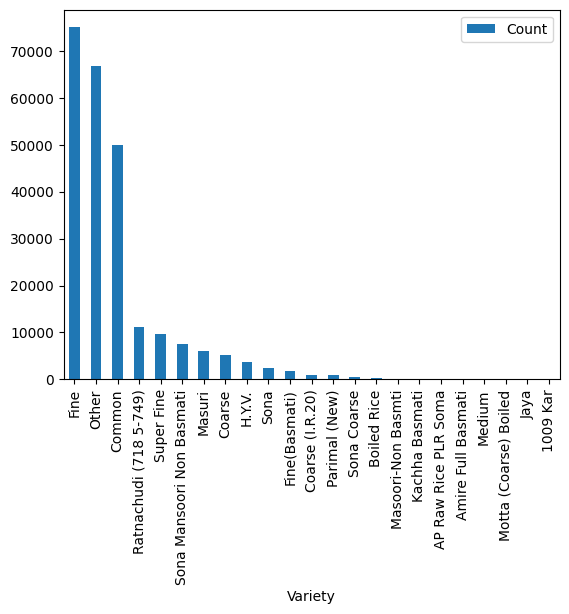

In [ ]:
variety = df['Variety'].value_counts().reset_index().rename(columns={'index':'Variety','Variety':'Count'})
variety.plot(x='Variety',y='Count',kind='bar')
plt.show()

In [ ]:
print(df['Variety'].value_counts())

Fine                         75040
Other                        66763
Common                       49905
Ratnachudi (718 5-749)       11118
Super Fine                    9632
Sona Mansoori Non Basmati     7527
Masuri                        6011
Coarse                        5290
H.Y.V.                        3689
Sona                          2501
Fine(Basmati)                 1819
Coarse (I.R.20)                967
Parimal (New)                  923
Sona Coarse                    412
Boiled Rice                    263
Masoori-Non Basmti              17
Kachha Basmati                   3
AP Raw Rice PLR Soma             2
Amire Full Basmati               2
Medium                           1
Motta (Coarse) Boiled            1
Jaya                             1
1009 Kar                         1
Name: Variety, dtype: int64


In [ ]:
var = list(df['Variety'].unique())

In [ ]:
var

['Fine',
 'Common',
 'Super Fine',
 'Fine(Basmati)',
 'Other',
 'Masuri',
 'Coarse',
 'Ratnachudi (718 5-749)',
 'Sona Mansoori Non Basmati',
 'H.Y.V.',
 'Sona Coarse',
 'Parimal (New)',
 'Medium',
 'Masoori-Non Basmti',
 'Coarse (I.R.20)',
 'Sona',
 'Motta (Coarse) Boiled',
 'Jaya',
 '1009 Kar',
 'Boiled Rice',
 'AP Raw Rice PLR Soma',
 'Amire Full Basmati',
 'Kachha Basmati']

<ipython-input-23-c6bf50b2a3be>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=district_sales.values, y=district_sales.index, palette='Set2')


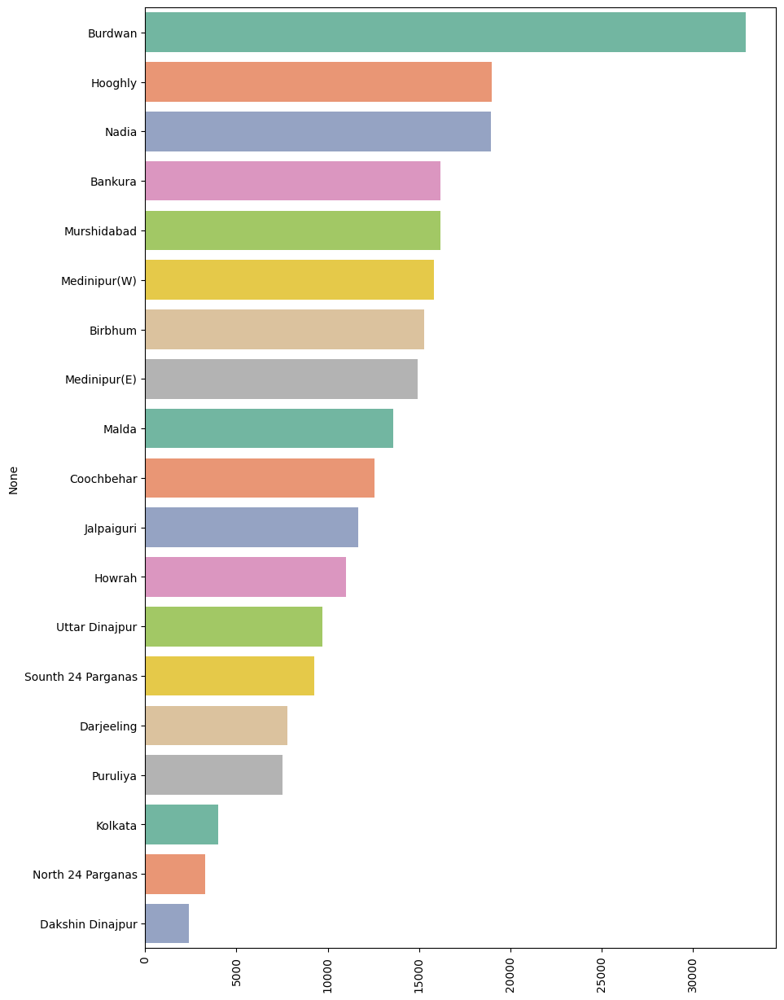

In [ ]:
# Get the counts of rice sales for each district
district_sales = df['District Name'].value_counts()

# Create a bar plot with the counts of rice sales for each district
plt.figure(figsize=(10, 15))
sns.barplot(x=district_sales.values, y=district_sales.index, palette='Set2')

# Rotate the x-axis labels to be vertical
plt.xticks(rotation=90)

# Show the plot
plt.show()


<ipython-input-24-2dc9ef774f74>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=district_sales.values, y=district_sales.index, palette='Set2')


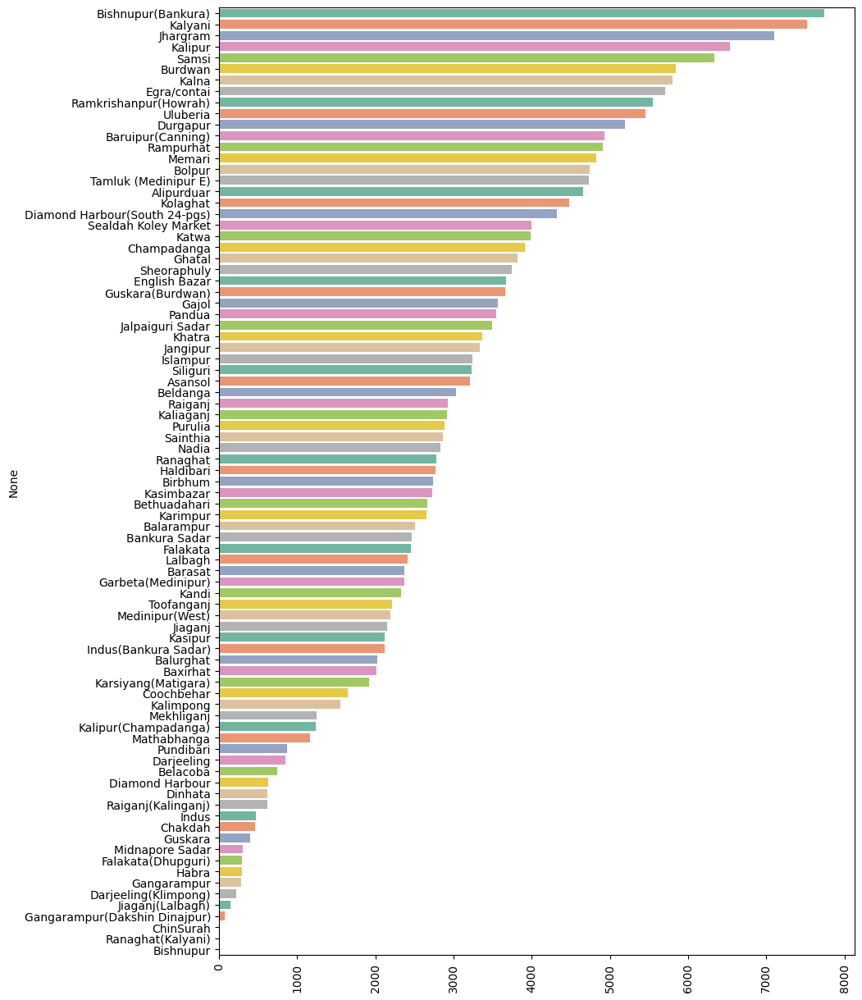

In [ ]:
# Get the counts of rice sales for each Market
district_sales = df['Market Name'].value_counts()

# Create a bar plot with the counts of rice sales for each district
plt.figure(figsize=(10, 15))
sns.barplot(x=district_sales.values, y=district_sales.index, palette='Set2')

# Rotate the x-axis labels to be vertical
plt.xticks(rotation=90)

# Show the plot
plt.show()

In [ ]:
dist = list(df['Market Name'].unique())


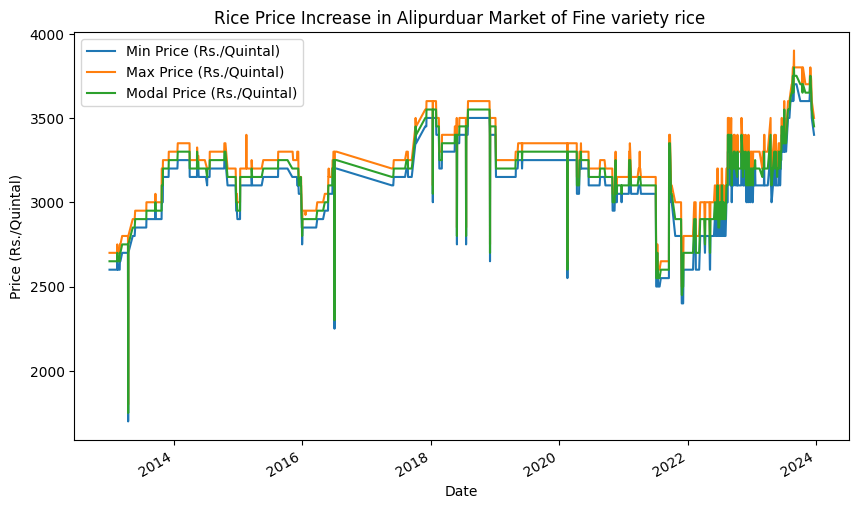

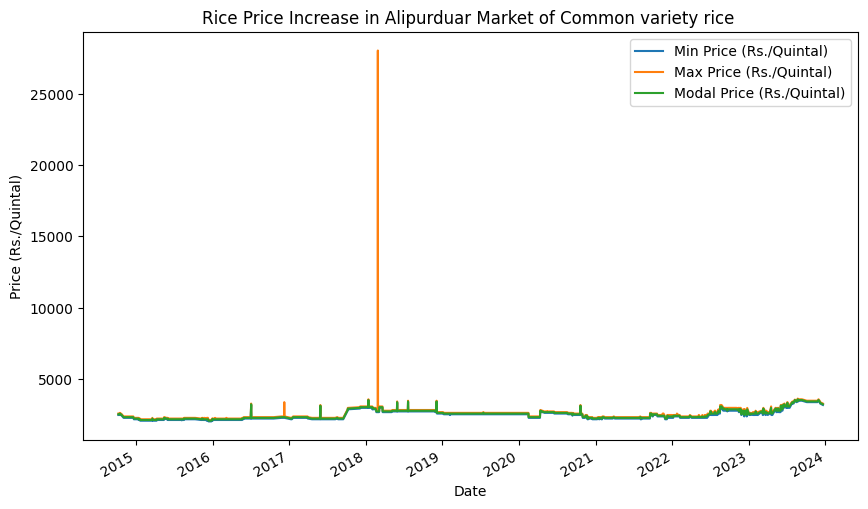

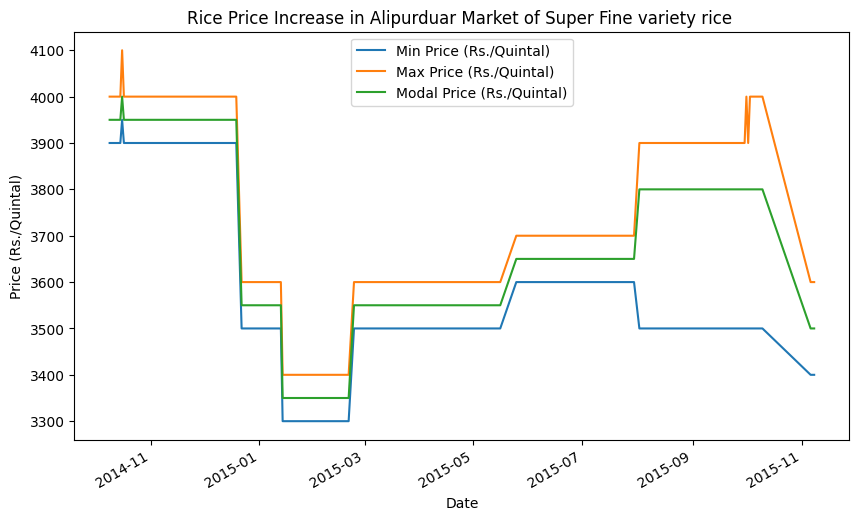

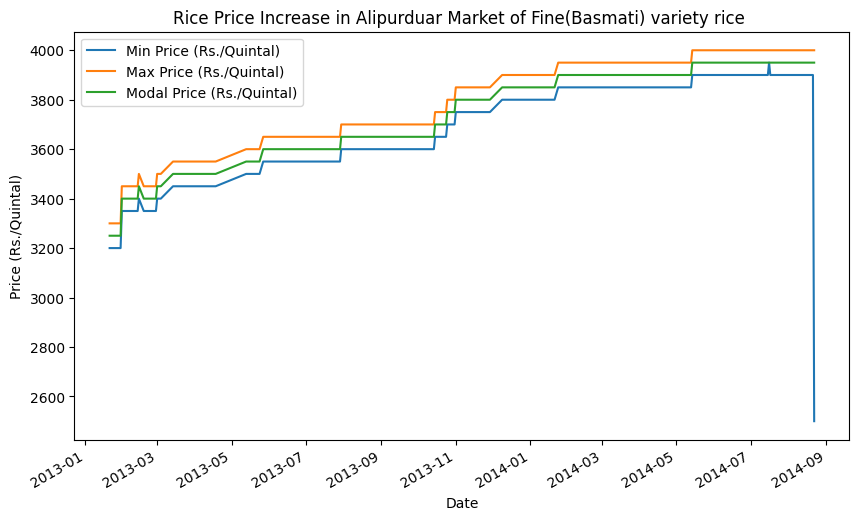

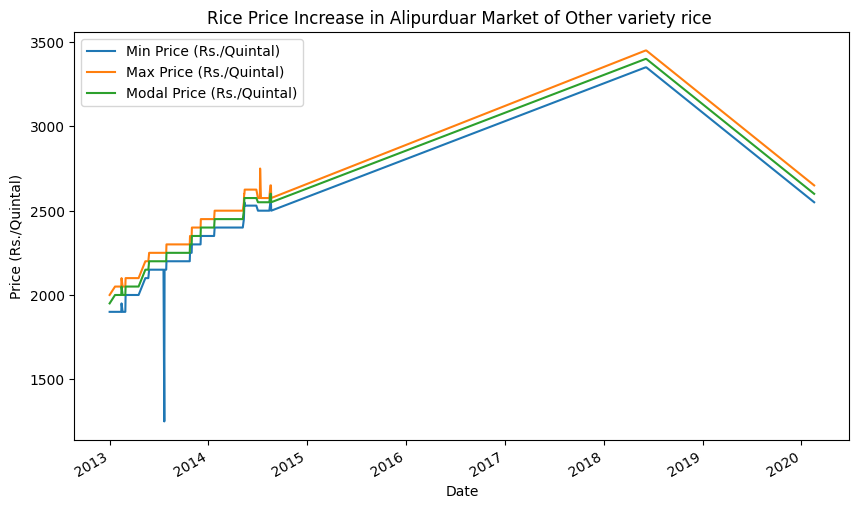

...

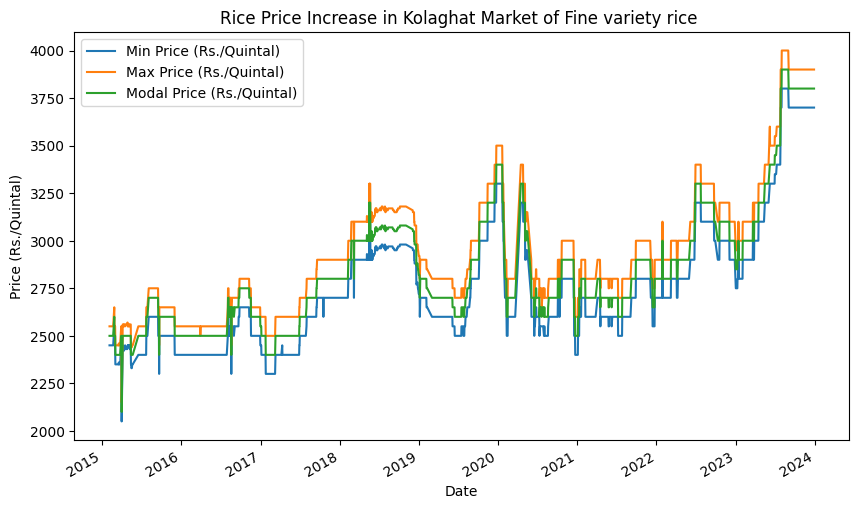

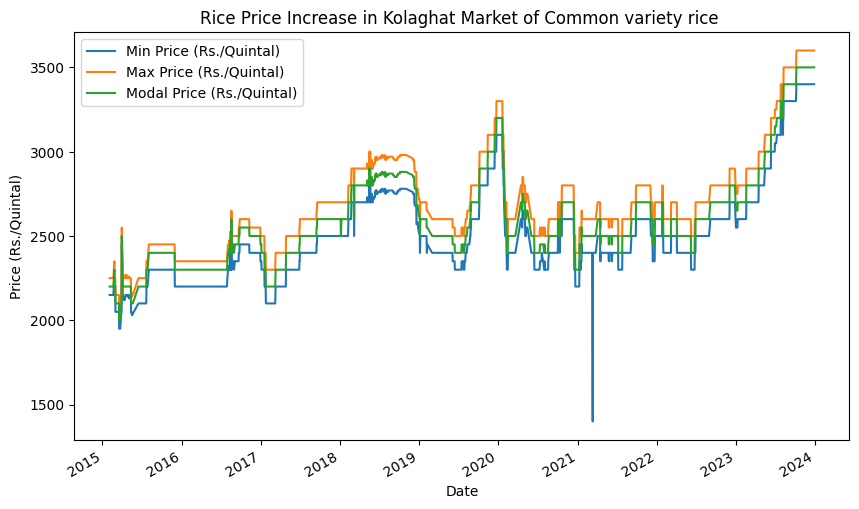

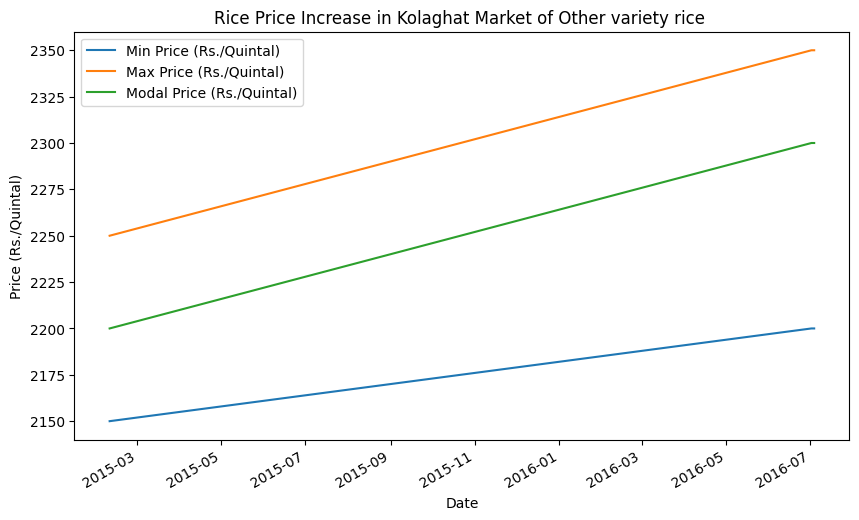

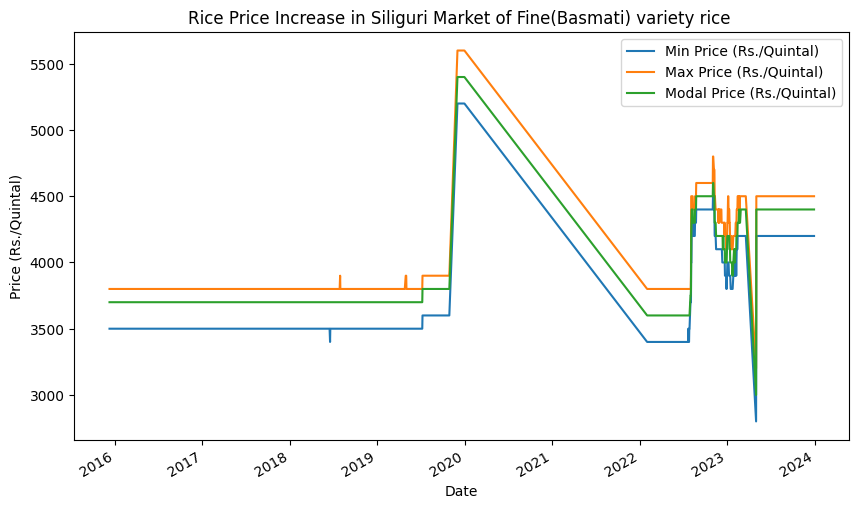

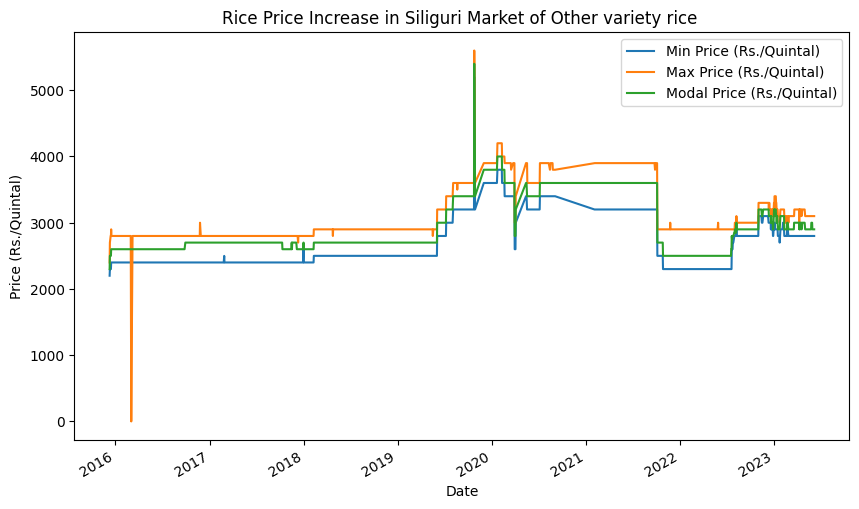

In [ ]:
for i in dist:
  df_filtered = df[df['Market Name']== i]
  uniq_var = list(df_filtered['Variety'].unique())
  for j in uniq_var:
    df_filtered_var = df_filtered[df_filtered['Variety']==j]
    df_new = df_filtered_var[['Price Date', 'Min Price (Rs./Quintal)', 'Max Price (Rs./Quintal)', 'Modal Price (Rs./Quintal)']]
    df_new.set_index('Price Date', inplace=True)

    # Plot the data
    df_new.plot(figsize=(10, 6))
    plt.xlabel('Date')
    plt.ylabel('Price (Rs./Quintal)')
    plt.title('Rice Price Increase in '+str(i)+' Market of '+str(j)+' variety rice ')
    plt.show()

##Make a data frame which contains District name , market names in that district and number of markets in that district

In [ ]:
# print  each market of counts  of diffenrent variety of  rices

for market in df['Market Name'].unique():
  market_df = df[df['Market Name'] == market]
  variety_counts = market_df['Variety'].value_counts()
  print(f"Market: {market}")
  for variety, count in variety_counts.items():
    print(f"\tVariety: {variety}, Count: {count}")

Market: Alipurduar
	Variety: Fine, Count: 1970
	Variety: Common, Count: 1842
	Variety: Other, Count: 312
	Variety: Fine(Basmati), Count: 304
	Variety: Super Fine, Count: 232
Market: Asansol
	Variety: Fine, Count: 2918
	Variety: Other, Count: 295
Market: Balurghat
	Variety: Other, Count: 1106
	Variety: Masuri, Count: 847
	Variety: Common, Count: 65
	Variety: Coarse, Count: 4
Market: Bankura Sadar
	Variety: Common, Count: 1756
	Variety: Other, Count: 713
Market: Barasat
	Variety: Masuri, Count: 1047
	Variety: Other, Count: 890
	Variety: Ratnachudi (718 5-749), Count: 217
	Variety: Super Fine, Count: 217
Market: Baruipur(Canning)
	Variety: Common, Count: 2498
	Variety: Super Fine, Count: 2269
	Variety: Sona Mansoori Non Basmati, Count: 168
Market: Baxirhat
	Variety: Common, Count: 1116
	Variety: Masuri, Count: 518
	Variety: Other, Count: 279
	Variety: Fine, Count: 100
	Variety: 1009 Kar, Count: 1
Market: Belacoba
	Variety: Super Fine, Count: 248
	Variety: Fine, Count: 248
	Variety: Other,

In [ ]:
df_market = df.groupby(['District Name'])['Market Name'].unique().reset_index()
df_market.rename(columns={'Market Name':'Market Names'}, inplace = True)

df_market['Market Number'] = df_market['Market Names'].str.len()

In [ ]:
df_market

,District Name,Market Names,Market Number
0,Bankura,"[Bankura Sadar, Bishnupur(Bankura), Indus, Ind...",5
1,Birbhum,"[Birbhum, Bishnupur, Bolpur, Rampurhat, Sainthia]",5
2,Burdwan,"[Asansol, Burdwan, Durgapur, Guskara, Guskara(...",8
3,Coochbehar,"[Baxirhat, Coochbehar, Dinhata, Haldibari, Mat...",8
4,Dakshin Dinajpur,"[Balurghat, Gangarampur, Gangarampur(Dakshin D...",3
5,Darjeeling,"[Darjeeling, Darjeeling(Klimpong), Kalimpong, ...",5
6,Hooghly,"[Champadanga, ChinSurah, Kalipur, Kalipur(Cham...",6
7,Howrah,"[Ramkrishanpur(Howrah), Uluberia]",2
8,Jalpaiguri,"[Alipurduar, Belacoba, Falakata(Dhupguri), Jal...",5
9,Kolkata,[Sealdah Koley Market],1


In [ ]:
sum = 0
for i in range(len(df_market['Market Number'])):
  data =  df_market['Market Number'][i]
  sum = sum + data
print(sum)

85


In [ ]:
#make a dataframe which contains all unique 85 market name from df and a index of that market

market_names = df['Market Name'].unique()
market_names
len(market_names)
df_market_name = pd.DataFrame({'MarketName':market_names})
df_market_name.reset_index(inplace = True)

In [ ]:
df_market_name.head()

,index,MarketName
0,0,Alipurduar
1,1,Asansol
2,2,Balurghat
3,3,Bankura Sadar
4,4,Barasat


In [ ]:
len(df_market_name['index'])

85

In [ ]:
df_market_name

,index,MarketName
0,0,Alipurduar
1,1,Asansol
2,2,Balurghat
3,3,Bankura Sadar
4,4,Barasat
...,...,...
80,80,Balarampur
81,81,Falakata
82,82,Gangarampur(Dakshin Dinajpur)
83,83,Kolaghat


In [ ]:
# change Egra/contai name to Egra in df_market_name

df_market_name.loc[df_market_name['MarketName'] == 'Egra/contai', 'MarketName'] = 'Egra'


In [ ]:
df_market_name

,index,MarketName
0,0,Alipurduar
1,1,Asansol
2,2,Balurghat
3,3,Bankura Sadar
4,4,Barasat
...,...,...
80,80,Balarampur
81,81,Falakata
82,82,Gangarampur(Dakshin Dinajpur)
83,83,Kolaghat


In [ ]:
import glob
import shutil

##Now divide the big excel file into small excel files

according to market name and variety type

In [ ]:
# prompt: write a program to index all varieties from df

varieties = df['Variety'].unique()
variety_index = {}
for i, variety in enumerate(varieties):
  variety_index[variety] = i


In [ ]:
variety_index

{'Fine': 0,
 'Common': 1,
 'Super Fine': 2,
 'Fine(Basmati)': 3,
 'Other': 4,
 'Masuri': 5,
 'Coarse': 6,
 'Ratnachudi (718 5-749)': 7,
 'Sona Mansoori Non Basmati': 8,
 'H.Y.V.': 9,
 'Sona Coarse': 10,
 'Parimal (New)': 11,
 'Medium': 12,
 'Masoori-Non Basmti': 13,
 'Coarse (I.R.20)': 14,
 'Sona': 15,
 'Motta (Coarse) Boiled': 16,
 'Jaya': 17,
 '1009 Kar': 18,
 'Boiled Rice': 19,
 'AP Raw Rice PLR Soma': 20,
 'Amire Full Basmati': 21,
 'Kachha Basmati': 22}

In [ ]:
# prompt: write a command to print the index number of Fine

print(variety_index['Fine'])


0


In [ ]:
market_names


array(['Alipurduar', 'Asansol', 'Balurghat', 'Bankura Sadar', 'Barasat',
       'Baruipur(Canning)', 'Baxirhat', 'Belacoba', 'Beldanga',
       'Bethuadahari', 'Birbhum', 'Bishnupur', 'Bishnupur(Bankura)',
       'Bolpur', 'Burdwan', 'Chakdah', 'Champadanga', 'ChinSurah',
       'Coochbehar', 'Darjeeling', 'Darjeeling(Klimpong)',
       'Diamond Harbour', 'Diamond Harbour(South 24-pgs)', 'Dinhata',
       'Durgapur', 'Egra', 'English Bazar', 'Falakata(Dhupguri)', 'Gajol',
       'Gangarampur', 'Garbeta(Medinipur)', 'Ghatal', 'Guskara',
       'Guskara(Burdwan)', 'Habra', 'Haldibari', 'Indus',
       'Indus(Bankura Sadar)', 'Islampur', 'Jalpaiguri Sadar', 'Jangipur',
       'Jhargram', 'Jiaganj', 'Jiaganj(Lalbagh)', 'Kaliaganj',
       'Kalimpong', 'Kalipur', 'Kalipur(Champadanga)', 'Kalna', 'Kalyani',
       'Kandi', 'Karimpur', 'Karsiyang(Matigara)', 'Kasimbazar',
       'Kasipur', 'Katwa', 'Khatra', 'Lalbagh', 'Mathabhanga',
       'Medinipur(West)', 'Mekhliganj', 'Memari', 'Midnapor

In [ ]:
#main code which divide the excel files

market_names = df_market_name['MarketName'].unique()
destination_folder = "/content/drive/MyDrive/WB_Rice/variety_13-23"

i = 0
df_contains_all_markets_varaity = []
for market_name in market_names:
  #filter the data with respect to market
  df_filtered = df[df['Market Name'] == market_name]
  varietys = df_filtered['Variety'].unique()
  for variety in varietys:
    j = variety_index[variety]
    df_variety = df_filtered[df_filtered['Variety']== variety ]
    if df_variety.shape[0] > 60:

      #create a new dataframe with the filtered data
      df_contains_all_markets_varaity.append(df_variety)

      #file names
      filename = str(i)+'_'+str(j)+'_WB_rice_market_'+str(market_name)+'_'+str(variety)+'.xlsx'
      df_variety.to_excel("/content/drive/MyDrive/WB_Rice/variety_13-23/"+filename)
  i = i+1

In [ ]:
total_excel_files = i
print(total_excel_files)

85


In [ ]:
# export all excel files in /content to "/content/drive/MyDrive/WB_Rice/Market" this folder

!cp -r /content/*.xlsx "/content/drive/MyDrive/WB_Rice/variety_13-23"


cp: cannot stat '/content/*.xlsx': No such file or directory


In [ ]:
#take all files from /content/drive/MyDrive/WB_Rice/variety_13-23 and put then in content

!cp -r /content/drive/MyDrive/WB_Rice/variety_13-23/* /content


In [ ]:
# take all .xlsx files into a list
import glob

# Get the list of all Excel files in the current directory
excel_files = glob.glob('*.xlsx')

# Print the list of Excel files
print(excel_files)


['6_4_WB_rice_market_Baxirhat_Other.xlsx', '12_0_WB_rice_market_Bishnupur(Bankura)_Fine.xlsx', '55_4_WB_rice_market_Katwa_Other.xlsx', '74_0_WB_rice_market_Samsi_Fine.xlsx', '75_2_WB_rice_market_Sealdah Koley Market_Super Fine.xlsx', '5_2_WB_rice_market_Baruipur(Canning)_Super Fine.xlsx', '7_2_WB_rice_market_Belacoba_Super Fine.xlsx', '62_4_WB_rice_market_Midnapore Sadar_Other.xlsx', '84_3_WB_rice_market_Siliguri_Fine(Basmati).xlsx', '78_5_WB_rice_market_Toofanganj_Masuri.xlsx', '26_4_WB_rice_market_English Bazar_Other.xlsx', '64_4_WB_rice_market_Pandua_Other.xlsx', '67_4_WB_rice_market_Raiganj_Other.xlsx', '48_0_WB_rice_market_Kalna_Fine.xlsx', '4_7_WB_rice_market_Barasat_Ratnachudi (718 5-749).xlsx', '76_4_WB_rice_market_Sheoraphuly_Other.xlsx', '41_2_WB_rice_market_Jhargram_Super Fine.xlsx', '61_1_WB_rice_market_Memari_Common.xlsx', '67_1_WB_rice_market_Raiganj_Common.xlsx', '18_10_WB_rice_market_Coochbehar_Sona Coarse.xlsx', '66_4_WB_rice_market_Purulia_Other.xlsx', '52_4_WB_rice_m

In [ ]:
excel_files[0]

'6_4_WB_rice_market_Baxirhat_Other.xlsx'

In [ ]:
#shot the file names by the first number of the data

import re

excel_files = sorted(excel_files, key=lambda x: int(re.findall(r'\d+', x)[0]))

print(excel_files)


['0_2_WB_rice_market_Alipurduar_Super Fine.xlsx', '0_3_WB_rice_market_Alipurduar_Fine(Basmati).xlsx', '0_4_WB_rice_market_Alipurduar_Other.xlsx', '0_0_WB_rice_market_Alipurduar_Fine.xlsx', '0_1_WB_rice_market_Alipurduar_Common.xlsx', '1_4_WB_rice_market_Asansol_Other.xlsx', '1_0_WB_rice_market_Asansol_Fine.xlsx', '2_5_WB_rice_market_Balurghat_Masuri.xlsx', '2_1_WB_rice_market_Balurghat_Common.xlsx', '2_4_WB_rice_market_Balurghat_Other.xlsx', '3_4_WB_rice_market_Bankura Sadar_Other.xlsx', '3_1_WB_rice_market_Bankura Sadar_Common.xlsx', '4_7_WB_rice_market_Barasat_Ratnachudi (718 5-749).xlsx', '4_2_WB_rice_market_Barasat_Super Fine.xlsx', '4_5_WB_rice_market_Barasat_Masuri.xlsx', '4_4_WB_rice_market_Barasat_Other.xlsx', '5_2_WB_rice_market_Baruipur(Canning)_Super Fine.xlsx', '5_8_WB_rice_market_Baruipur(Canning)_Sona Mansoori Non Basmati.xlsx', '5_1_WB_rice_market_Baruipur(Canning)_Common.xlsx', '6_4_WB_rice_market_Baxirhat_Other.xlsx', '6_0_WB_rice_market_Baxirhat_Fine.xlsx', '6_5_WB_ri

In [ ]:
len(excel_files)

188

In [ ]:
market_path  = '/content/'+excel_files[0]

In [ ]:
# first_market_path='/content/WB_alipurdure_13-23.xlsx'

In [ ]:
market = pd.read_excel(market_path)

In [ ]:
market.head()

,Unnamed: 0,Sl no.,District Name,Market Name,Commodity,Variety,Grade,Min Price (Rs./Quintal),Max Price (Rs./Quintal),Modal Price (Rs./Quintal),Price Date
0,2,3,Jalpaiguri,Alipurduar,Rice,Super Fine,FAQ,3500,3600,3550,2014-12-31
1,3,4,Jalpaiguri,Alipurduar,Rice,Super Fine,FAQ,3500,3600,3550,2014-12-30
2,8,9,Jalpaiguri,Alipurduar,Rice,Super Fine,FAQ,3500,3600,3550,2014-12-29
3,9,10,Jalpaiguri,Alipurduar,Rice,Super Fine,FAQ,3500,3600,3550,2014-12-26
4,14,15,Jalpaiguri,Alipurduar,Rice,Super Fine,FAQ,3500,3600,3550,2014-12-24


In [ ]:
market.drop(columns=[market.columns[0]], axis=1, inplace=True)


In [ ]:
market['Price Date'] = market['Price Date'].astype('datetime64[ns]')

In [ ]:
# arrage(shot) the market data through price date in a way that the last date datas will go to last

market.sort_values(by='Price Date', inplace=True)
market = market.reset_index(drop=True)


In [ ]:
market.head()

,Sl no.,District Name,Market Name,Commodity,Variety,Grade,Min Price (Rs./Quintal),Max Price (Rs./Quintal),Modal Price (Rs./Quintal),Price Date
0,137,Jalpaiguri,Alipurduar,Rice,Super Fine,FAQ,3900,4000,3950,2014-10-09
1,136,Jalpaiguri,Alipurduar,Rice,Super Fine,FAQ,3900,4000,3950,2014-10-10
2,131,Jalpaiguri,Alipurduar,Rice,Super Fine,FAQ,3900,4000,3950,2014-10-13
3,130,Jalpaiguri,Alipurduar,Rice,Super Fine,FAQ,3900,4000,3950,2014-10-14
4,125,Jalpaiguri,Alipurduar,Rice,Super Fine,FAQ,3900,4000,3950,2014-10-15


In [ ]:
market['Variety'].unique()

array(['Super Fine'], dtype=object)

In [ ]:
market.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 232 entries, 0 to 231
Data columns (total 10 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   Sl no.                     232 non-null    int64         
 1   District Name              232 non-null    object        
 2   Market Name                232 non-null    object        
 3   Commodity                  232 non-null    object        
 4   Variety                    232 non-null    object        
 5   Grade                      232 non-null    object        
 6   Min Price (Rs./Quintal)    232 non-null    int64         
 7   Max Price (Rs./Quintal)    232 non-null    int64         
 8   Modal Price (Rs./Quintal)  232 non-null    int64         
 9   Price Date                 232 non-null    datetime64[ns]
dtypes: datetime64[ns](1), int64(4), object(5)
memory usage: 18.2+ KB


In [ ]:
data.shape

()

In [ ]:
# divide the data dataframe into small data frame according to the variety

variety_list = data['Variety'].unique()
market_name = data['Market Name'].unique()[0]
for variety in variety_list:
  df_variety = data[data['Variety'] == variety]
  df_variety.reset_index(inplace=True)
  filename = str(market_name)+'_market_data_' + variety + '.xlsx'
  df_variety.to_excel(filename)

In [ ]:
first_market_data_Common = pd.read_excel('/content/Alipurduar_market_data_Common.xlsx')

In [ ]:
first_market_data_Common.sort_values(by='Price Date', inplace=True)
first_market_data_Common = first_market_data_Common.reset_index(drop=True)

In [ ]:
first_market_data_Common.shape

(551, 10)

In [ ]:
first_market_data_Common.drop(first_market_data_Common.columns[0], axis=1, inplace=True)
first_market_data_Common.head()

,Price Date,District Name,Market Name,Commodity,Variety,Grade,Min Price (Rs./Quintal),Max Price (Rs./Quintal),Modal Price (Rs./Quintal)
0,2021-01-01,Jalpaiguri,Alipurduar,Rice,Common,FAQ,2200,2300,2250
1,2021-01-03,Jalpaiguri,Alipurduar,Rice,Common,FAQ,2200,2300,2250
2,2021-01-04,Jalpaiguri,Alipurduar,Rice,Common,FAQ,2200,2300,2250
3,2021-01-05,Jalpaiguri,Alipurduar,Rice,Common,FAQ,2200,2300,2250
4,2021-01-06,Jalpaiguri,Alipurduar,Rice,Common,FAQ,2200,2300,2250
